In [55]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from igraph import Graph, RainbowPalette, plot
import cairo

In [2]:
def self_join_df(df):
    # Ensure that the DataFrame has 'user_id' and 'business_id' columns
    if 'user_id' not in df.columns or 'business_id' not in df.columns:
        raise ValueError("DataFrame must contain 'user_id' and 'business_id' columns.")
    
    # Perform a self-join on 'user_id'
    joined_df = df.merge(df, on='user_id', suffixes=('_left', '_right'))
    
    # Filter rows where 'business_id' is different
    result_df = joined_df[joined_df['business_id_left'] != joined_df['business_id_right']]
    
    # Drop unnecessary columns
    result_df = result_df[['user_id', 'business_id_left', 'business_id_right', 'stars_left', 'stars_right']]

    # Reset the index
    result_df.reset_index(drop=True, inplace=True)
    
    return result_df

In [3]:
# Load the restaurant dataset
restaurants = pd.read_csv('data/tucson_restaurants.csv')

# Count the number of categories in each row
restaurants['numcat'] = restaurants['categories'].str.split(',').apply(len)

# filter out rows with 3 categories
df_res = restaurants[restaurants['numcat'] == 3].copy(deep=True)
df_res.reset_index(drop=True, inplace=True)
print('shape .::.', df_res.shape)

# Create a new column for each category
df_res['category1'] = df_res['categories'].str.split(',').apply(lambda x: x[0])
df_res['category2'] = df_res['categories'].str.split(',').apply(lambda x: x[1])
df_res['category3'] = df_res['categories'].str.split(',').apply(lambda x: x[2])

# Drop unnecessary columns
df_res = df_res[['business_id', 'name', 'stars', 'review_count', 'is_open', 'category1', 'category2', 'category3']]
df_res.head()

shape .::. (452, 7)


,business_id,name,stars,review_count,is_open,category1,category2,category3
0,iNMdSi5bmvGSGeRQiUW4dw,Wendy's,2.5,14,1,Fast Food,Burgers,Restaurants
1,UAi8nZY-tCA758y4_8Meuw,Fullylove’s Restaurant,4.5,25,0,Vegan,American (New),Restaurants
2,5N5K-B0pA3as6dvl_ha5BQ,Famous Sam's Restaurant & Bar,2.0,25,0,Burgers,Restaurants,American (Traditional)
3,lhsQkb5nhf-Kd5OvgB9MNg,Sachiko Sushi,3.5,191,1,Japanese,Restaurants,Sushi Bars
4,XyGRDrgCK0z4CiA6nhwEaw,Persian Room Fine Dining,4.5,258,1,Restaurants,Persian/Iranian,Mediterranean


In [40]:
restaurants['categories'].str.split(',').apply(len).sort_index().value_counts()

2     460
3     452
4     437
5     427
6     310
7     152
8      92
9      60
10     30
11     15
12     13
1       8
13      5
14      2
15      2
17      2
22      1
18      1
25      1
Name: categories, dtype: int64

In [4]:
# Load the review dataset
reviews = pd.read_csv('data/tucson_reviews.csv')

# Filter out rows that are not in the restaurant dataset
reviews_df = reviews[reviews['business_id'].isin(df_res['business_id'])].copy(deep=True)

# Reset the index
reviews_df.reset_index(drop=True, inplace=True)

print('Old shape .::.', reviews.shape)
print('New shape .::.', reviews_df.shape)

# Perform self join
joined_df = self_join_df(reviews_df)
# Save the DataFrame to a CSV file
# joined_df.to_csv('output/tucson_reviews_self_joined.csv', index=False)
print('Joined shape .::.', joined_df.shape)
joined_df.head()


Old shape .::. (191113, 9)
New shape .::. (22029, 9)
Joined shape .::. (54076, 5)


,user_id,business_id_left,business_id_right,stars_left,stars_right
0,1yXp7EkfmcxXOomfHxTu-g,B10mqANgHvL8gBteo1UhAA,vzvm7_QXEDaMTxMOKLBNyQ,2,3
1,1yXp7EkfmcxXOomfHxTu-g,B10mqANgHvL8gBteo1UhAA,36rz3AMPh8ETMJq7cTG2Rw,2,2
2,1yXp7EkfmcxXOomfHxTu-g,B10mqANgHvL8gBteo1UhAA,6BZ1gasOkF1mNfmUxfYqhA,2,3
3,1yXp7EkfmcxXOomfHxTu-g,B10mqANgHvL8gBteo1UhAA,dMGWB4TEfEhgInQefGimAw,2,5
4,1yXp7EkfmcxXOomfHxTu-g,B10mqANgHvL8gBteo1UhAA,EwWcloIMj8zflH5Dc16-nw,2,5


In [5]:
# Create an sample of the DataFrame with 5,000 rows and stars_left == stars_right
df_join_sample = joined_df[joined_df.stars_left == joined_df.stars_right].sample(5_000, random_state=42)

# Create a links dataframe 
links = df_join_sample[['business_id_left', 'business_id_right']].copy(deep=True)
links['weight'] = 5
links.columns = ['source', 'target', 'weight']
links.reset_index(drop=True, inplace=True)
# links.to_csv('output/links.csv', index=False)
links.head()

,source,target,weight
0,_uDhUdcNBtgiOXPGPWunoQ,Zg83olSjsdXAhE5EEy5IcQ,5
1,LIcsCCOYqBO9k2tiO4Mrow,YdZS3QkpjgHU2zIJ_bqy_A,5
2,wexGsdw5Wz85-hOBx9r2Tg,gwOiwfeHxBemcMV6u1dI_w,5
3,aDL_KdxbDRT5s51Jtn9V5g,q_fvK1U95dwKebz6JDRSxg,5
4,wLybne33jvVt6rs9ji8bww,t-abv5g6bjbYwLerN_4VKw,5


In [6]:
nodes = df_res.drop_duplicates().copy(deep=True)
nodes.reset_index(drop=True, inplace=True)
nodes.columns = ['business_id', 'business_name', 'stars', 'review_count', 'is_open', 'category1', 'category2', 'category3']
# nodes.to_csv('output/nodes.csv', index=False)
nodes.head()

,business_id,business_name,stars,review_count,is_open,category1,category2,category3
0,iNMdSi5bmvGSGeRQiUW4dw,Wendy's,2.5,14,1,Fast Food,Burgers,Restaurants
1,UAi8nZY-tCA758y4_8Meuw,Fullylove’s Restaurant,4.5,25,0,Vegan,American (New),Restaurants
2,5N5K-B0pA3as6dvl_ha5BQ,Famous Sam's Restaurant & Bar,2.0,25,0,Burgers,Restaurants,American (Traditional)
3,lhsQkb5nhf-Kd5OvgB9MNg,Sachiko Sushi,3.5,191,1,Japanese,Restaurants,Sushi Bars
4,XyGRDrgCK0z4CiA6nhwEaw,Persian Room Fine Dining,4.5,258,1,Restaurants,Persian/Iranian,Mediterranean


In [62]:
# Create a graph from the links and nodes
net = Graph.DataFrame(links, directed=False, use_vids=False, vertices=nodes)

In [63]:
print(net.summary())

IGRAPH UNW- 452 5000 -- 
+ attr: business_name (v), category1 (v), category2 (v), category3 (v), is_open (v), name (v), review_count (v), stars (v), weight (e)


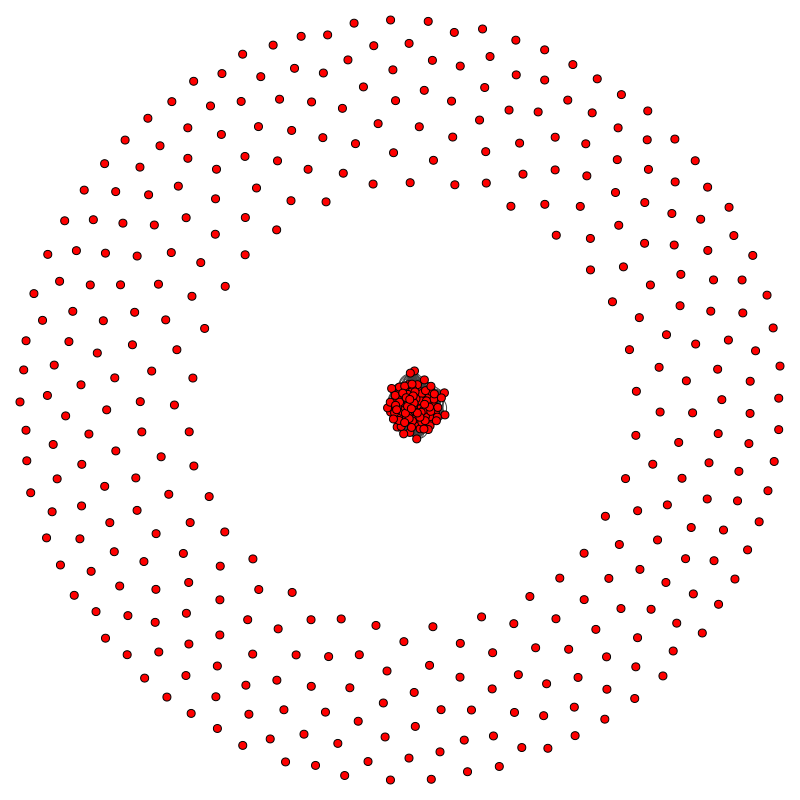

In [64]:
plot(net, edge_arrow_size=0.2, vertex_size=8, bbox=(800, 800), vertex_spacing=150)

In [19]:
# Get the number of nodes (vertices)
num_nodes = len(net.vs)

print("Number of nodes:", num_nodes)

# Get the number of edges
num_edges = len(net.es)

print("Number of edges:", num_edges)

Number of nodes: 452
Number of edges: 5000


In [51]:
print("Number of vertices:", net.vcount())
print("Number of edges:", net.ecount())
print("Density of the graph:", 2*net.ecount()/(net.vcount()*(net.vcount()-1)))
print("Diameter of the graph:", net.diameter())

Number of vertices: 452
Number of edges: 3431
Density of the graph: 0.033661676117967936
Diameter of the graph: 3


In [50]:
degrees = []
total = 0
n_vertices = net.vcount()

for n in range(n_vertices):
    neighbours = net.neighbors(n, mode='ALL')
    total += len(neighbours)
    degrees.append(len(neighbours))
    
print("Average degree:", total/n_vertices)
print("Maximum degree:", max(degrees))
print("Vertex ID with the maximum degree:", degrees.index(max(degrees)))

Average degree: 15.18141592920354
Maximum degree: 127
Vertex ID with the maximum degree: 77


In [54]:
cliques = net.cliques(min=3, max=3)
triangle_count = [0] * net.vcount()
for i, j, k in cliques:
    triangle_count[i] += 1
    triangle_count[j] += 1
    triangle_count[k] += 1

print("Average number of triangles:", sum(triangle_count)/net.vcount())
print("Maximum number of triangles:", max(triangle_count))
print("Vertex ID with the maximum number of triangles:", triangle_count.index(max(triangle_count)))

Average number of triangles: 142.43362831858408
Maximum number of triangles: 1559
Vertex ID with the maximum number of triangles: 77


/var/folders/1w/k9637z597nn40_dksv68jh1h0000gn/T/ipykernel_34607/2560441428.py:1: RuntimeWarning: Edge directions are ignored for clique calculations at src/cliques/cliquer_wrapper.c:42
  cliques = net.cliques(min=3, max=3)


Degree having the maximum number of vertices: 0
Number of vertices having the most abundant degree: 348


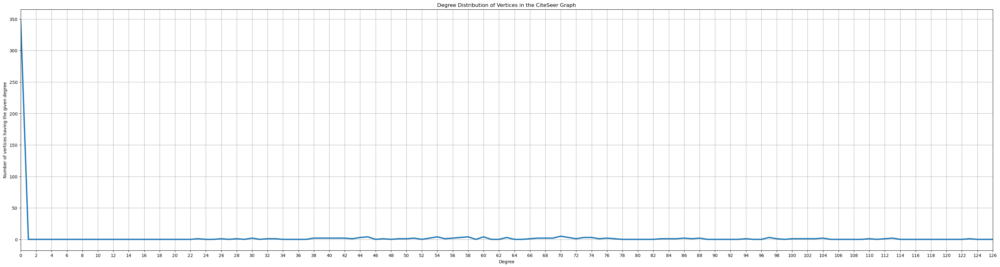

In [57]:
x = [x for x in range(max(degrees)+1)]
degree_counts = [0 for x in range(max(degrees)+1)]

for i in degrees:
    degree_counts[i] += 1

print("Degree having the maximum number of vertices:", degree_counts.index(max(degree_counts)))
print("Number of vertices having the most abundant degree:", max(degree_counts))

plt.figure(figsize=(40,10))
plt.plot(x, degree_counts, linewidth=3.0)
plt.ylabel('Number of vertices having the given degree')
plt.xlabel('Degree')
plt.title('Degree Distribution of Vertices in the CiteSeer Graph')

plt.xlim(0,100)
plt.xticks(np.arange(min(x), max(x)+1, 2.0))
plt.grid(True)
# plt.savefig('degree_distribution.png', bbox_inches='tight')
plt.show()


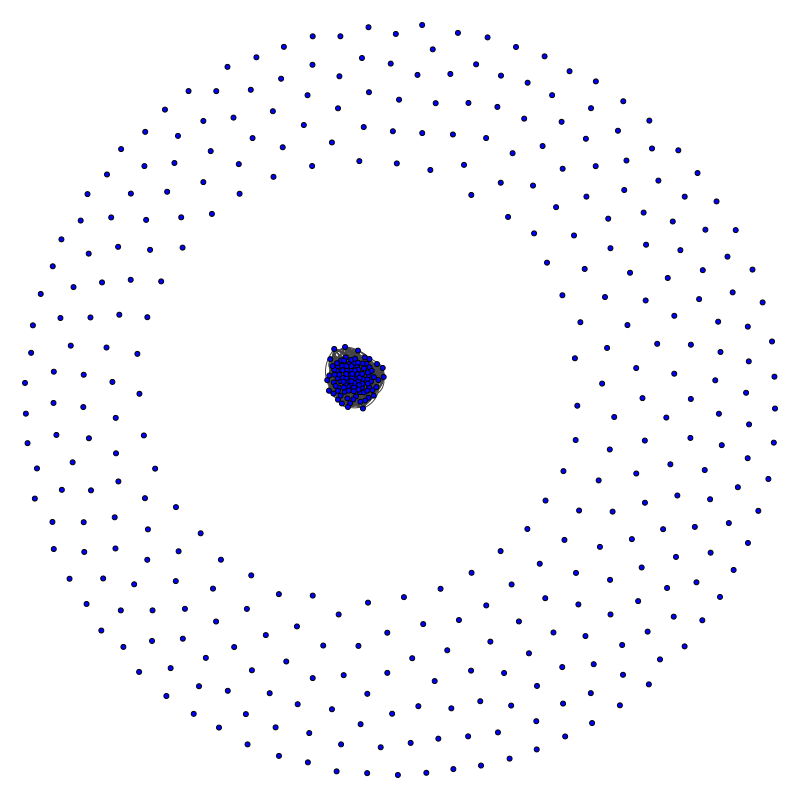

In [69]:
visual_style = {}

# Define colors used for outdegree visualization
colours = ['#fecc5c', '#a31a1c']

# Set bbox and margin
visual_style["bbox"] = (800,800)
visual_style["margin"] = 25

# Set vertex colours
visual_style["vertex_color"] = 'blue'

# Set vertex size
visual_style["vertex_size"] = 5

# Set vertex spacing
visual_style["vertex_spacing"] = 150


# Don't curve the edges
visual_style["edge_curved"] = True

# Set the layout
my_layout = net.layout_fruchterman_reingold()
visual_style["layout"] = my_layout

# Plot the graph
plot(net, **visual_style)

IGRAPH UNW- 452 2431 -- 
+ attr: business_name (v), category1 (v), category2 (v), category3 (v), is_open (v), name (v), review_count (v), stars (v), weight (e)


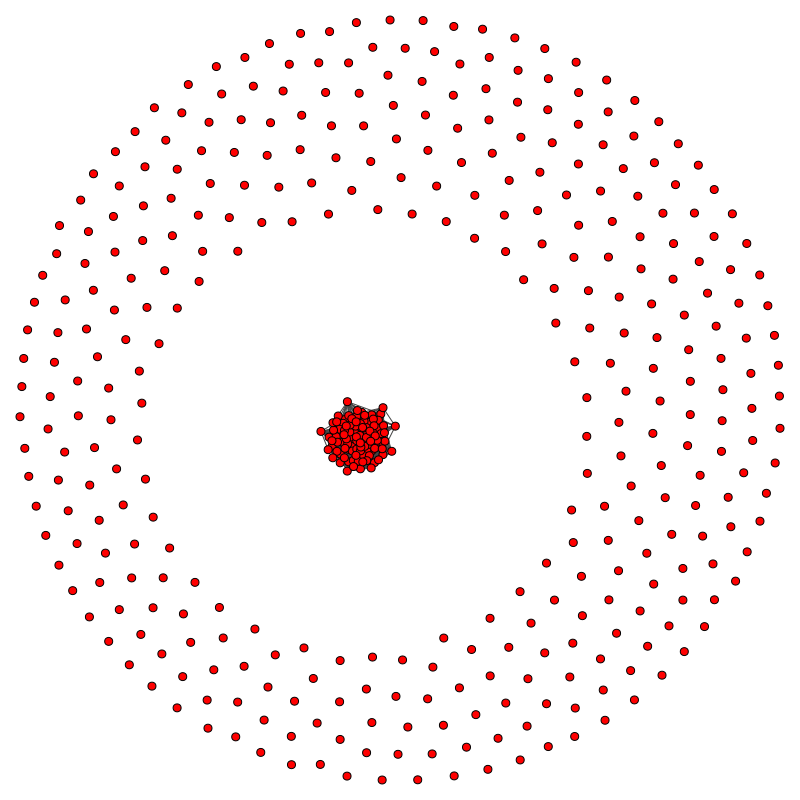

In [73]:
net_simp = net.simplify(multiple=True, loops=False, ,combine_edges=dict(weight="sum"))

print(net_simp.summary())
plot(net_simp, edge_arrow_size=0.2, vertex_size=8, bbox=(900, 900), vertex_spacing=250)

In [25]:
# Density: The proportion of present edges from all possible edges in the network
edge_density = net.density(loops=False)
print(f"Density: {edge_density:0.4f}")
print(f"or... {net.ecount() / (net.vcount() * (net.vcount() - 1)):0.4f}")

Density: 0.0168
or... 0.0168


In [26]:
# Diameter: longest geodesic distance (eccentricity) between any two vertices in the network
diameter_undirected = net.diameter(directed=False, weights=None)
print(f"Undirected diameter: {diameter_undirected}")
diameter_directed = net.diameter(directed=True, weights=None)
print(f"Directed diameter: {diameter_directed}")
diameter_weighted = net.diameter(directed=False, weights="weight")
print(f"Weighted undirected diameter: {diameter_weighted}")

Undirected diameter: 2
Directed diameter: 3
Weighted undirected diameter: 10.0


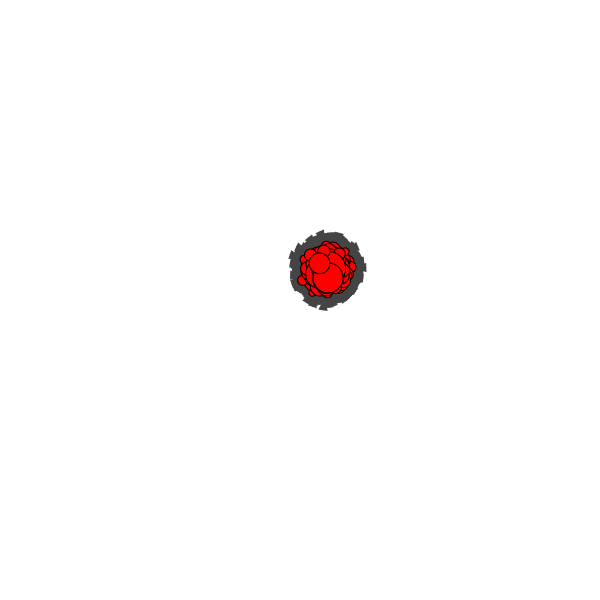

In [30]:
# Node degrees: how many edges are connected to a node
# The mode="ALL" parameter means that it calculates the total degree, considering both incoming and outgoing edges for directed graphs
deg = net.degree(mode="ALL")

# plot the network with node size proportional to degree
plot(net, vertex_size=[d * .3 for d in deg])

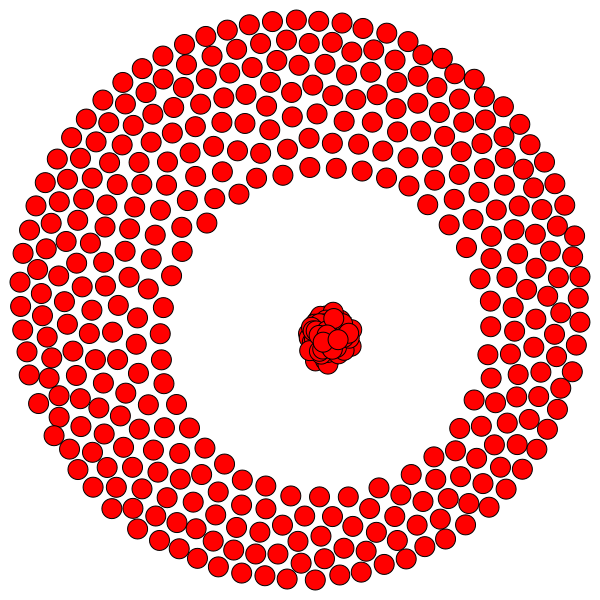

In [31]:
# Plot with curved edges
plot(net, edge_arrow_size=0.4, edge_curved=0.1)

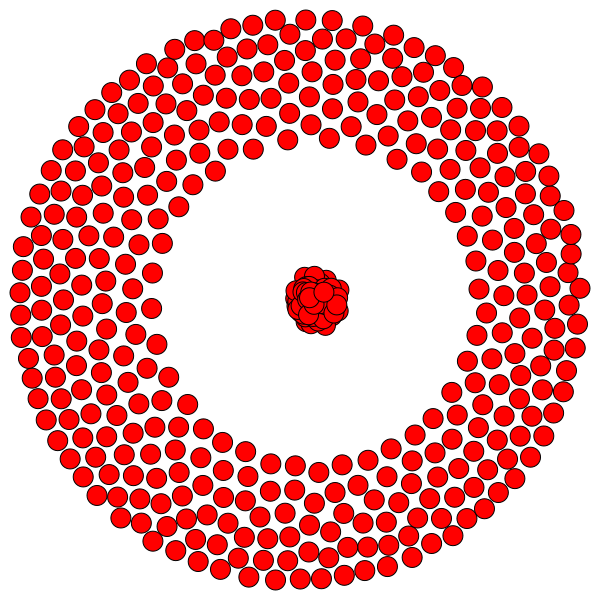

In [32]:

# Set edge color to gray, and the node color to orange
visual_style = {}
# Set edge width based on weight
visual_style["edge_width"] = [1 + weight / 12 for weight in net.es["weight"]]
# Change arrow size and edge color
visual_style["edge_arrow_size"] = 0.2
visual_style["edge_color"] = "gray80"

plot(net, **visual_style)

In [33]:
# Community detection based on edge betweenness (Newman-Girvan)
# High-betweenness edges are removed sequentially (recalculating at each step) and the best partitioning of the network is selected.
communities = net.community_edge_betweenness() 
communities = communities.as_clustering() # just for ease of use

# coloring the nodes based on the community they belong to
num_communities = len(communities)
palette = RainbowPalette(n=num_communities)
for i, community in enumerate(communities):
    net.vs[community]["color"] = i
    community_edges = net.es.select(_within=community)
    community_edges["color"] = i

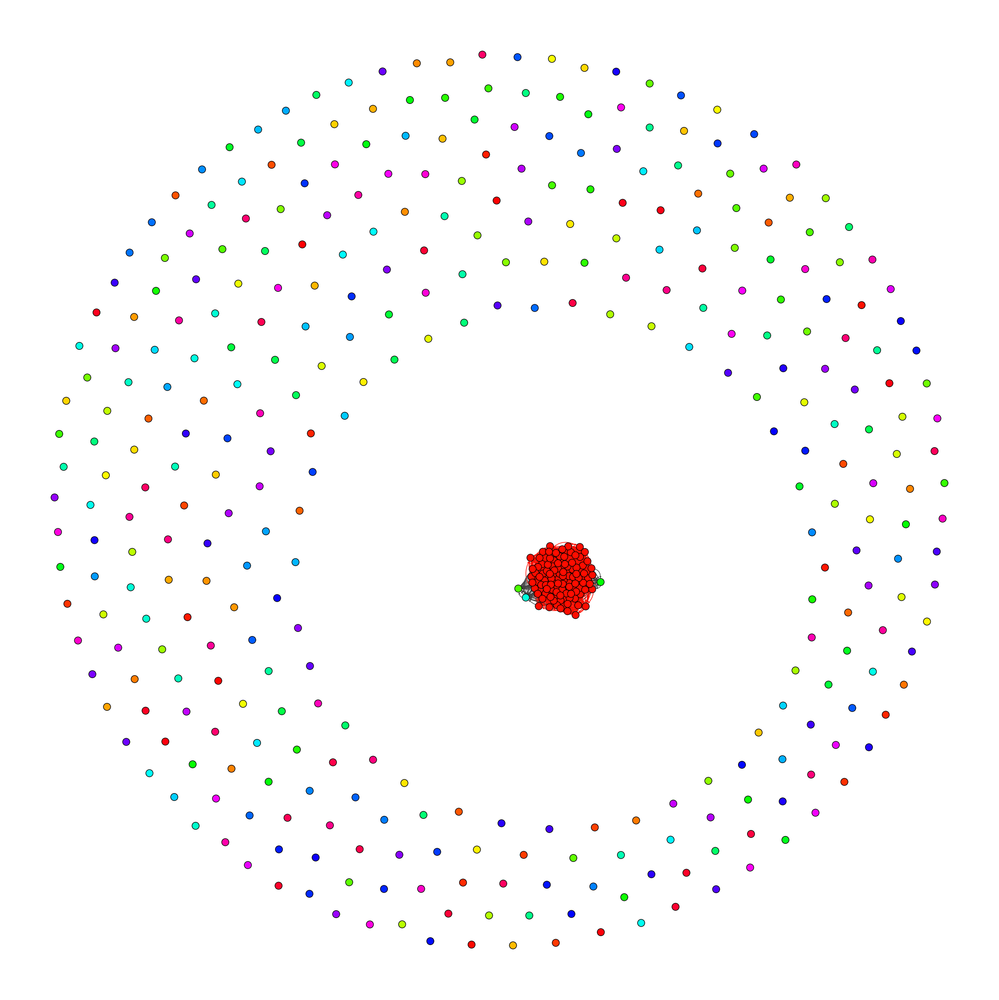

In [34]:
fig, ax = plt.subplots(figsize=(30, 30))
plot(
    communities,
    palette=palette,
    edge_width=1,
    target=ax,
    vertex_size=0.3,
)
# remove nodes without edges

# Create a custom color legend
""" legend_handles = []
for i in range(num_communities):
    handle = ax.scatter(
        [], [],
        s=100,
        facecolor=palette.get(i),
        edgecolor="k",
        label=i,
    )
    legend_handles.append(handle)
ax.legend(
    handles=legend_handles,
    title='Community:',
    bbox_to_anchor=(0, 1.0),
    bbox_transform=ax.transAxes,
) """
plt.show()

In [35]:
degree_centrality = net_simp.degree()
betweenness_centrality = net_simp.betweenness()
cluster_coeff = net_simp.transitivity_local_undirected(mode="zero")
# calculate the eigenvector centrality
eigenvector_centrality = net_simp.eigenvector_centrality(directed=False, weights="weight")
# calculate the pagerank
pagerank = net_simp.pagerank(directed=False, weights="weight")
# calculate closeness centrality
closeness_centrality = net_simp.closeness(normalized=True)

In [36]:
# Combine the centrality measures and cluster coefficients into a dictionary
node_metrics = {
    "Degree Centrality": degree_centrality,
    "Betweenness Centrality": betweenness_centrality,
    "Cluster Coefficient": cluster_coeff,
    "Eigenvector Centrality": eigenvector_centrality,
    "PageRank": pagerank,
    "Closeness Centrality": closeness_centrality,
}

In [37]:
# Sort the nodes by the chosen metric (e.g., "Degree Centrality")
sorted_nodes = sorted(range(len(net_simp.vs)), key=lambda x: node_metrics["Degree Centrality"][x], reverse=True)

# Get the top 10 nodes based on the chosen metric
top_10_nodes = sorted_nodes[:10]

print(top_10_nodes)

[77, 309, 248, 440, 107, 182, 216, 324, 319, 284]


In [38]:
# Print the top 10 nodes and their metric values
top_10_data = []
for node in top_10_nodes:
    node_data = {"Node": node}
    for metric_name, metric_values in node_metrics.items():
        node_data[metric_name] = metric_values[node]
    top_10_data.append(node_data)

# Create a DataFrame from the list of dictionaries
top_10_df = pd.DataFrame(top_10_data)

# Print the DataFrame
top_10_df

,Node,Degree Centrality,Betweenness Centrality,Cluster Coefficient,Eigenvector Centrality,PageRank,Closeness Centrality
0,77,127,203.192845,0.194851,1.000000,0.016732,0.798450
1,309,123,253.178578,0.188591,0.758290,0.014651,0.792308
2,248,113,194.781911,0.224874,0.627856,0.011428,0.792308
3,440,113,218.363882,0.197377,0.536977,0.011253,0.762963
4,107,112,218.647174,0.210746,0.658012,0.012119,0.780303
5,182,110,187.703384,0.186322,0.652846,0.012845,0.741007
6,216,104,173.144263,0.240851,0.434118,0.009243,0.768657
7,324,104,143.470857,0.222928,0.463613,0.009611,0.741007
8,319,103,177.395256,0.243861,0.660304,0.011510,0.768657
9,284,102,174.326884,0.219375,0.476241,0.009575,0.746377


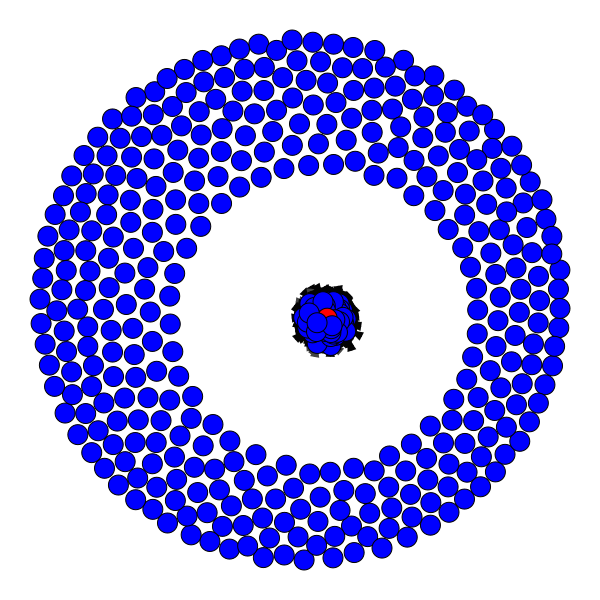

In [41]:
from igraph import Graph, plot
# Create a layout for the graph
layout = net_simp.layout("fr")

# Create a plot and highlight the top 10 nodes using the vertex_color parameter
plot(net_simp, layout=layout, bbox=(600, 600), margin=40, vertex_color=["red" if v.index in top_10_nodes else "blue" for v in net_simp.vs])

In [42]:
print(f"Number of communities: {num_communities}")

Number of communities: 352


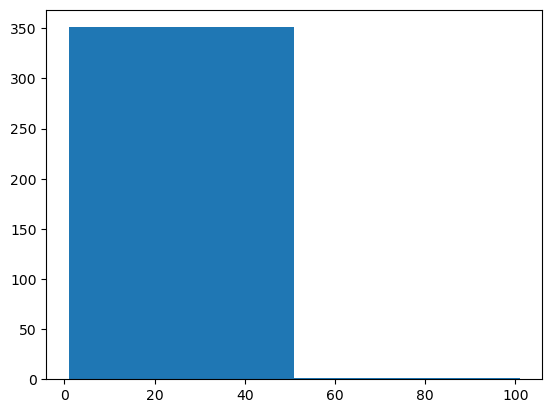

In [45]:
# plot histogram of community sizes
community_sizes = [len(community) for community in communities]
plt.hist(community_sizes, bins=2);

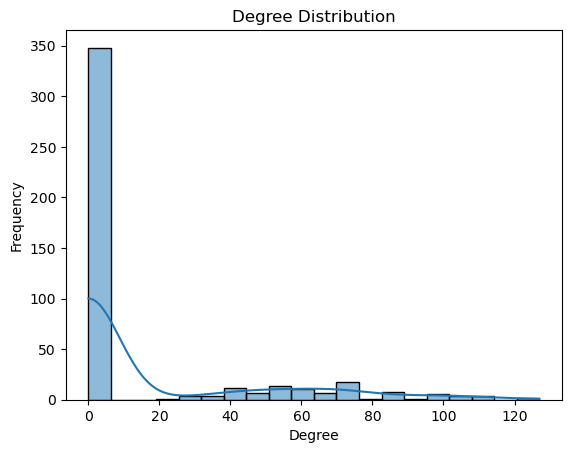

In [46]:
sns.histplot(deg, bins=20, kde=True)
plt.xlabel("Degree")
plt.ylabel("Frequency")
plt.title("Degree Distribution")
plt.show()

Vertices in the largest connected component: [3, 4, 10, 16, 19, 24, 25, 36, 54, 60, 62, 63, 64, 65, 70, 71, 73, 77, 81, 85, 87, 89, 96, 98, 99, 106, 107, 116, 118, 121, 122, 130, 131, 136, 138, 140, 144, 147, 153, 154, 156, 157, 161, 164, 167, 168, 173, 175, 178, 179, 182, 186, 192, 195, 199, 207, 216, 221, 223, 232, 238, 239, 242, 248, 252, 262, 263, 268, 269, 271, 280, 284, 286, 290, 293, 305, 307, 309, 311, 317, 319, 323, 324, 329, 333, 338, 346, 350, 356, 362, 364, 375, 376, 387, 394, 411, 419, 423, 425, 427, 440, 445, 447, 448]


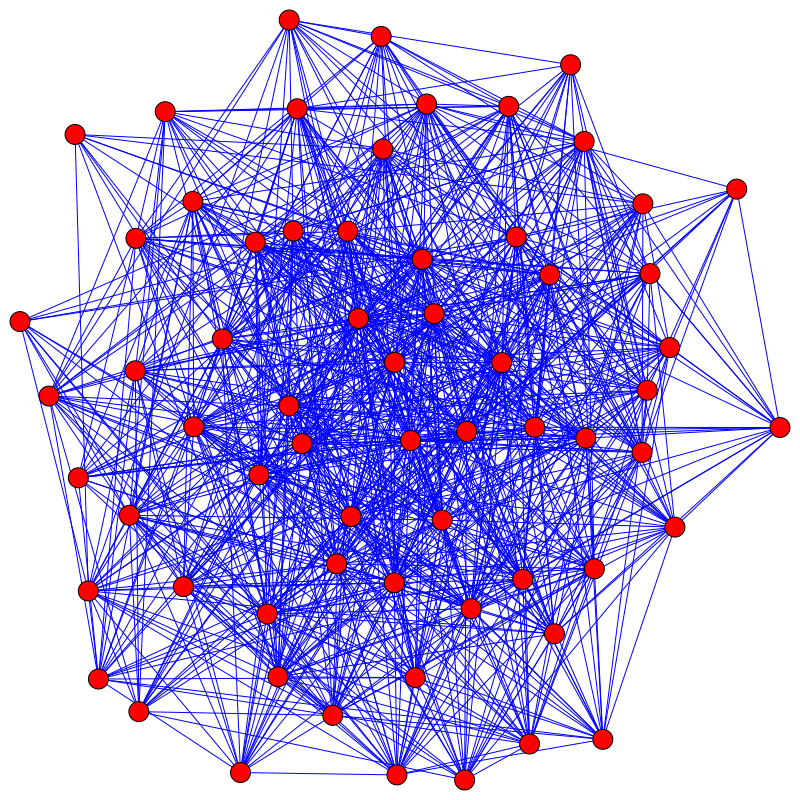

In [78]:
# Find connected components
components = net.components()

# Get the largest connected component
largest_component = max(components, key=len)

# Perform any analysis on the largest connected component
print("Vertices in the largest connected component:", largest_component)

# change color of nodes in largest component
net.vs["color"] = ["red" if v.index in largest_component else "blue" for v in net.vs]

# change color of edges in largest component
net.es["color"] = ["blue" if e.source in largest_component and e.target in largest_component else "red" for e in net.es]

# Plot the largest connected component
plot(net.subgraph(largest_component[0:65]), bbox=(800, 800), vertex_spacing=250)

In [48]:
len(largest_component)

104